In [1]:
import pandas as pd
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

from astropy.io import fits
import astropy.units as u
from astropy.table import Table, vstack
import astropy
from astropy.wcs import WCS
from astropy.time import Time
from astropy.coordinates import SkyCoord
import getpass

import lsst.afw.display as afwDisplay
import lsst.afw.geom as afwGeom
import lsst.afw.image as afwImage
from lsst.daf.butler import Butler
import lsst.geom as geom

from lsst.source.injection import ingest_injection_catalog, generate_injection_catalog
from lsst.source.injection import VisitInjectConfig, VisitInjectTask

# from lsst.ip.diffim.subtractImages import AlardLuptonSubtractTask, AlardLuptonSubtractConfig

In [2]:
afwDisplay.setDefaultBackend('matplotlib')
plt.style.use('tableau-colorblind10')

# Load collection with step1 step2: the calexps

In [3]:
my_collection_identifier = 'test_512025_1_t4026p15y2022'
print(my_collection_identifier)

user = os.getenv("USER")
print(user)

my_outputCollection = f"u/{user}_pm/{my_collection_identifier}" 
print('Name of new butler collection for my output: ', my_outputCollection)

test_512025_1_t4026p15y2022
taceroc
Name of new butler collection for my output:  u/taceroc_pm/test_512025_1_t4026p15y2022


In [4]:
#load collection with calexp 
my_collection_identifier_step1step2 = 'test_512025_1_t4026p15y2022'
print(my_collection_identifier_step1step2)

collections_step1step2 = f"u/{user}_pm/{my_collection_identifier_step1step2}" 
print('Name of new butler collection for my output: ', collections_step1step2)

# load butler
repo = '/global/cfs/cdirs/lsst/production/gen3/DC2/Run2.2i/repo'
butler = Butler(repo, collections=collections_step1step2)

#list calexps
calexp_list = list(butler.registry.queryDataIds(
    ["tract", "patch", "visit", "detector"],
    instrument="LSSTCam-imSim",
    datasets="calexp",
    collections=collections_step1step2,))

#list visit table
visitTableRef = list(butler.registry.queryDatasets('visitTable'))

# load visit table
visitTable = pd.DataFrame()
for v in visitTableRef:
    visitTable_uni = butler.get(v)
    # visitTable_uni = visitTable_uni[visitTable_uni['band'] == 'g']
    visitTable = pd.concat([visitTable,visitTable_uni])

# load day_obs calexps
day_obds = [x['day_obs'] for x in calexp_list]

#organize dates
dates_calexps = pd.DataFrame()
dates_calexps.loc[:, 'year'] = [str(x)[:4] for x in day_obds]
dates_calexps.loc[:, 'month'] = [str(x)[4:6] for x in day_obds]
dates_calexps.loc[:, 'day'] = [str(x)[6:] for x in day_obds]
dates_calexps.loc[:, 'time'] = dates_calexps.loc[:, 'year']+'-'+dates_calexps.loc[:, 'month']+'-'+dates_calexps.loc[:, 'day']
dates_calexps.loc[:, 'time'] = dates_calexps.loc[:, 'time'].map(lambda x: Time(x))
dates_calexps.loc[:, 'mjd'] = dates_calexps.loc[:, 'time'].map(lambda x: x.mjd)
dates_calexps.loc[:, 'mjd'] = dates_calexps.loc[:, 'mjd'].map(lambda x: round(x,0))

# group by year and month, we want a coadd per month
dates_calexps_ym = dates_calexps.groupby(["year", "month"]).agg({'mjd':'first', 'time':'count'})
dates_calexps_ym.reset_index(inplace=True)

test_512025_1_t4026p15y2022
Name of new butler collection for my output:  u/taceroc_pm/test_512025_1_t4026p15y2022


# Load coadds for each month pair given by the visit summary, same used to built the coadd

01 02
02 07
07 08
08 09
09 10
10 11
11 12


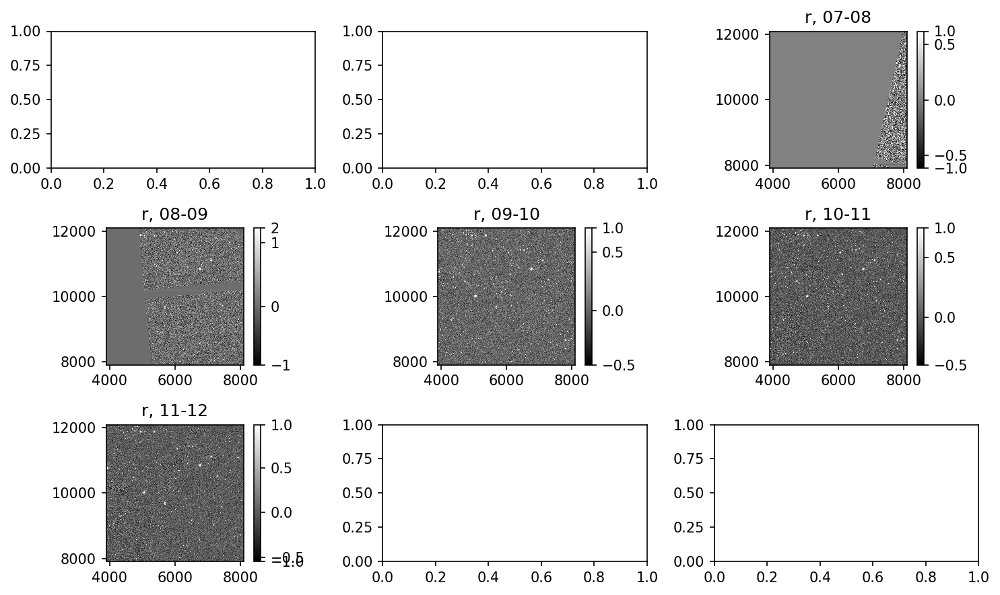

In [5]:
fig, ax = plt.subplots(3,3, figsize=(10, 6), dpi=150)
ax = ax.ravel()[:7]
coadd_to_use = []
collection_to_use = []
for i in range(len(dates_calexps_ym)-1):
    print(dates_calexps_ym['month'][i], dates_calexps_ym['month'][i+1])
    list_collections = butler.registry.queryCollections(f"u/taceroc_pm/*_t4026p15y2022_coadd*{dates_calexps_ym['month'][i]}-{dates_calexps_ym['month'][i+1]}*")
    my_outputCollection = list_collections[-1]
    collection_to_use.append(my_outputCollection)
    butler = Butler(repo, collections=my_outputCollection)
    coadd_list = list(butler.registry.queryDatasets('deepCoadd', where="tract = 4026 AND patch = 15 AND skymap = 'DC2' AND band = 'r' "))
    if len(coadd_list) >= 1:
        coadd_to_use.append(coadd_list[0])
        deepCoadd_test = butler.get(coadd_list[0])
        
        plt.sca(ax[i])
        display2 = afwDisplay.Display(frame=fig)
        display2.scale('linear', 'zscale')
        # display2.scale('linear', min=-20, max=150)
        display2.mtv(deepCoadd_test.image)
        plt.title(f"{coadd_list[0].dataId['band']}, {dates_calexps_ym['month'][i]}-{dates_calexps_ym['month'][i+1]}")
plt.tight_layout()
plt.show()

In [6]:
list_collections

['u/taceroc_pm/test_512025_1_t4026p15y2022_coadd_5282025_1_202211-12/20250528T180351Z',
 'u/taceroc_pm/test_512025_1_t4026p15y2022_coadd_5282025_1_202211-12']

In [7]:
coadd_to_use

[DatasetRef(DatasetType('deepCoadd', {band, skymap, tract, patch}, ExposureF), {band: 'r', skymap: 'DC2', tract: 4026, patch: 15}, run='u/taceroc_pm/test_512025_1_t4026p15y2022_coadd_592025_1_202207-08/20250509T170053Z', id=6615c369-9cde-40a3-9128-5024bf08e0e7),
 DatasetRef(DatasetType('deepCoadd', {band, skymap, tract, patch}, ExposureF), {band: 'r', skymap: 'DC2', tract: 4026, patch: 15}, run='u/taceroc_pm/test_512025_1_t4026p15y2022_coadd_592025_1_202208-09/20250509T195303Z', id=5175339e-8314-4e67-9859-9d285c27ae7c),
 DatasetRef(DatasetType('deepCoadd', {band, skymap, tract, patch}, ExposureF), {band: 'r', skymap: 'DC2', tract: 4026, patch: 15}, run='u/taceroc_pm/test_512025_1_t4026p15y2022_coadd_592025_1_202209-10/20250510T035101Z', id=29edea34-ed3e-4782-b59b-45c578caf98f),
 DatasetRef(DatasetType('deepCoadd', {band, skymap, tract, patch}, ExposureF), {band: 'r', skymap: 'DC2', tract: 4026, patch: 15}, run='u/taceroc_pm/test_512025_1_t4026p15y2022_coadd_5232025_1_202210-11/20250523

# Load LEs simulations fits files

In [8]:
# list_fits = sorted(glob.glob("fits/4026_15/*220*.fits"))
# list_fits = sorted(glob.glob("fits/4026_15/*52000.0pc.fits"))
list_fits = sorted(glob.glob("fits/4026_15_v2/plane8/*52000.0pc.fits"))


In [9]:
list_fits

['fits/4026_15_v2/plane8/surface_valueslc2_InfPlane_dt0_loop_ct400_loc[0, 0, 1, -26.09248]_dz0.06_w567_angle[0, 360]_sourced52000.0pc.fits',
 'fits/4026_15_v2/plane8/surface_valueslc2_InfPlane_dt0_loop_ct450_loc[0, 0, 1, -26.09248]_dz0.06_w567_angle[0, 360]_sourced52000.0pc.fits',
 'fits/4026_15_v2/plane8/surface_valueslc2_InfPlane_dt0_loop_ct500_loc[0, 0, 1, -26.09248]_dz0.06_w567_angle[0, 360]_sourced52000.0pc.fits',
 'fits/4026_15_v2/plane8/surface_valueslc2_InfPlane_dt0_loop_ct550_loc[0, 0, 1, -26.09248]_dz0.06_w567_angle[0, 360]_sourced52000.0pc.fits',
 'fits/4026_15_v2/plane8/surface_valueslc2_InfPlane_dt0_loop_ct700_loc[0, 0, 1, -26.09248]_dz0.06_w567_angle[0, 360]_sourced52000.0pc.fits']

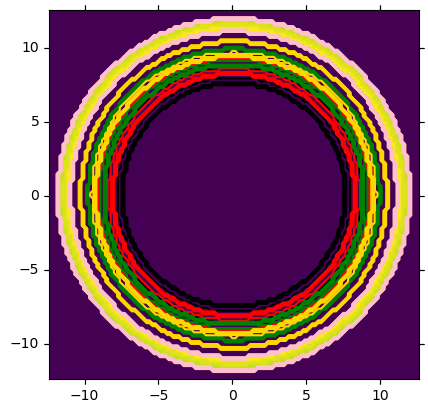

In [10]:
# hdu = fits.open(filename)[0]
stamp_img_hdu = fits.open(list_fits[-1])[0]
stamp_img_hdu0 = fits.open(list_fits[0])[0]
stamp_img_hdu1 = fits.open(list_fits[1])[0]
stamp_img_hdu2 = fits.open(list_fits[2])[0]
stamp_img_hdu3 = fits.open(list_fits[3])[0]
stamp_img_hdu4 = fits.open(list_fits[4])[0]
# stamp_img_hduwhole = fits.open(list_fits[0])[0]

fig, ax = plt.subplots(subplot_kw=dict(projection=WCS(stamp_img_hdu.header)))
ax.imshow(stamp_img_hdu.data, origin='lower')
ax.contour(stamp_img_hdu0.data, transform=ax.get_transform(WCS(stamp_img_hdu0.header)), colors='black')
ax.contour(stamp_img_hdu1.data, transform=ax.get_transform(WCS(stamp_img_hdu1.header)), colors='red')
ax.contour(stamp_img_hdu2.data, transform=ax.get_transform(WCS(stamp_img_hdu2.header)), colors='green')
ax.contour(stamp_img_hdu3.data, transform=ax.get_transform(WCS(stamp_img_hdu3.header)), colors='gold')
ax.contour(stamp_img_hdu4.data, transform=ax.get_transform(WCS(stamp_img_hdu4.header)), colors='pink')
# ax.contour(stamp_img_hduwhole.data, transform=ax.get_transform(WCS(stamp_img_hduwhole.header)), colors='grey')


In [11]:
stamp_img_hdu0.data.shape

(95, 95)

In [12]:
import pickle

# list_fits = sorted(glob.glob("fits/4026_15/*52000.0pc.fits"))
list_metadata = []
for lls in list_fits:
    edits = lls.replace(list_fits[0].split('surface')[0], 'lightecho_modeling_oop/OOP/results/LC_infplane_test_multi/arrays/')
    edits = edits.replace('surface_values', 'meta_info')
    edits = edits.replace('fits', 'pkl')
    list_metadata.append(edits)

list_metadata

['lightecho_modeling_oop/OOP/results/LC_infplane_test_multi/arrays/meta_infolc2_InfPlane_dt0_loop_ct400_loc[0, 0, 1, -26.09248]_dz0.06_w567_angle[0, 360]_sourced52000.0pc.pkl',
 'lightecho_modeling_oop/OOP/results/LC_infplane_test_multi/arrays/meta_infolc2_InfPlane_dt0_loop_ct450_loc[0, 0, 1, -26.09248]_dz0.06_w567_angle[0, 360]_sourced52000.0pc.pkl',
 'lightecho_modeling_oop/OOP/results/LC_infplane_test_multi/arrays/meta_infolc2_InfPlane_dt0_loop_ct500_loc[0, 0, 1, -26.09248]_dz0.06_w567_angle[0, 360]_sourced52000.0pc.pkl',
 'lightecho_modeling_oop/OOP/results/LC_infplane_test_multi/arrays/meta_infolc2_InfPlane_dt0_loop_ct550_loc[0, 0, 1, -26.09248]_dz0.06_w567_angle[0, 360]_sourced52000.0pc.pkl',
 'lightecho_modeling_oop/OOP/results/LC_infplane_test_multi/arrays/meta_infolc2_InfPlane_dt0_loop_ct700_loc[0, 0, 1, -26.09248]_dz0.06_w567_angle[0, 360]_sourced52000.0pc.pkl']

In [13]:
# with open(list_metadata[1], 'rb') as f:
#     meta_data = pickle.load(f)
# projection=WCS(stamp_img_hdu0.header)
# pixel_pos = projection.wcs_world2pix(meta_data[0]['act (arcsec)'], meta_data[0]['bct (arcsec)'],1)

In [14]:
# meta_data[0]

In [15]:
# pixel_pos

In [16]:
# projection.wcs_pix2world(*pixel_pos,1)

In [17]:
# pixel_pos = projection.wcs_world2pix(0,0,1)
# pixel_pos, projection.wcs_pix2world(*pixel_pos,1)

In [18]:
# fig, ax = plt.subplots(subplot_kw=dict(projection=WCS(stamp_img_hdu0.header)))
# ax.imshow(stamp_img_hduwhole.data, origin='lower')
# # ax.contour(stamp_img_hdu0.data, colors='black',origin='lower')
# # projection=WCS(stamp_img_hdu0.header)
# pixel_pos = projection.wcs_world2pix(0,0,1)
# ax.scatter(*pixel_pos)

# with open(list_metadata[1], 'rb') as f:
#     meta_data = pickle.load(f)
# projection=WCS(stamp_img_hdu0.header)
# pixel_pos = projection.wcs_world2pix(-meta_data[0]['act (arcsec)'], -meta_data[0]['bct (arcsec)'],1)
# ax.scatter(*pixel_pos, color='black', transform=ax.get_transform(WCS(stamp_img_hdu0.header)))

In [19]:
# meta_data[0]['act (arcsec)']/0.2, meta_data[0]['bct (arcsec)']/0.2

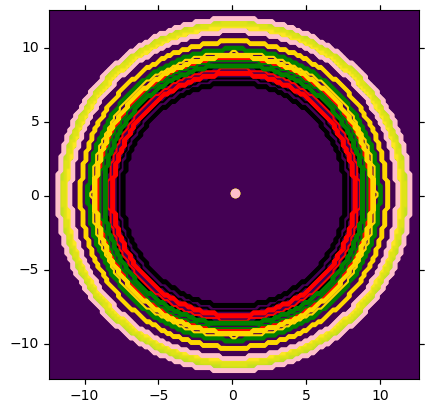

In [20]:
    
fig, ax = plt.subplots(subplot_kw=dict(projection=WCS(stamp_img_hdu.header)))
ax.imshow(stamp_img_hdu.data, origin='lower')
ax.contour(stamp_img_hdu0.data, transform=ax.get_transform(WCS(stamp_img_hdu0.header)), colors='black')
ax.contour(stamp_img_hdu1.data, transform=ax.get_transform(WCS(stamp_img_hdu1.header)), colors='red')
ax.contour(stamp_img_hdu2.data, transform=ax.get_transform(WCS(stamp_img_hdu2.header)), colors='green')
ax.contour(stamp_img_hdu3.data, transform=ax.get_transform(WCS(stamp_img_hdu3.header)), colors='gold')
ax.contour(stamp_img_hdu4.data, transform=ax.get_transform(WCS(stamp_img_hdu4.header)), colors='pink')
# ax.contour(stamp_img_hduwhole.data, transform=ax.get_transform(WCS(stamp_img_hduwhole.header)), colors='grey')

projection=WCS(stamp_img_hdu.header)
pixel_pos = projection.wcs_world2pix(0,0,1)
ax.scatter(*pixel_pos)

# list_metadata
with open(list_metadata[-1], 'rb') as f:
    meta_data = pickle.load(f)
projection=WCS(stamp_img_hdu.header)
pixel_pos = projection.wcs_world2pix(-meta_data[0]['act (arcsec)'], -meta_data[0]['bct (arcsec)'],1)
ax.scatter(pixel_pos[0], pixel_pos[1])

with open(list_metadata[0], 'rb') as f:
    meta_data = pickle.load(f)
projection=WCS(stamp_img_hdu0.header)
pixel_pos = projection.wcs_world2pix(-meta_data[0]['act (arcsec)'], -meta_data[0]['bct (arcsec)'],1)
ax.scatter(*pixel_pos, color='black', transform=ax.get_transform(WCS(stamp_img_hdu0.header)))

with open(list_metadata[1], 'rb') as f:
    meta_data = pickle.load(f)
projection=WCS(stamp_img_hdu1.header)
pixel_pos = projection.wcs_world2pix(-meta_data[0]['act (arcsec)'], -meta_data[0]['bct (arcsec)'],1)
ax.scatter(*pixel_pos, color='red', transform=ax.get_transform(WCS(stamp_img_hdu1.header)))


with open(list_metadata[2], 'rb') as f:
    meta_data = pickle.load(f)
projection=WCS(stamp_img_hdu2.header)
pixel_pos = projection.wcs_world2pix(-meta_data[0]['act (arcsec)'], -meta_data[0]['bct (arcsec)'],1)
ax.scatter(*pixel_pos, color='green', transform=ax.get_transform(WCS(stamp_img_hdu2.header)))

with open(list_metadata[3], 'rb') as f:
    meta_data = pickle.load(f)
projection=WCS(stamp_img_hdu3.header)
pixel_pos = projection.wcs_world2pix(-meta_data[0]['act (arcsec)'], -meta_data[0]['bct (arcsec)'],1)
ax.scatter(*pixel_pos, color='gold', transform=ax.get_transform(WCS(stamp_img_hdu3.header)))

with open(list_metadata[4], 'rb') as f:
    meta_data = pickle.load(f)
projection=WCS(stamp_img_hdu4.header)
pixel_pos = projection.wcs_world2pix(-meta_data[0]['act (arcsec)'], -meta_data[0]['bct (arcsec)'],1)
ax.scatter(*pixel_pos, color='pink', transform=ax.get_transform(WCS(stamp_img_hdu4.header)))


# Define injection catalog

In [72]:
ids_to_use_time = 3
coadd = butler.get(coadd_to_use[ids_to_use_time])
boxcen = coadd.getBBox().getCenter()
wcs_b = coadd.getWcs()
cen = wcs_b.pixelToSky(boxcen)
radec = SkyCoord(ra=cen[0].asDegrees()*u.deg, dec=cen[1].asDegrees()*u.deg)

print(radec)

imsize = coadd.getBBox().getDimensions()[0]*wcs_b.getPixelScale().asDegrees()
print('Size of calexp in degrees: ', imsize)

inject_size = imsize/2

<SkyCoord (ICRS): (ra, dec) in deg
    (57.85714959, -35.17965612)>
Size of calexp in degrees:  0.23333333327427816


In [22]:
coadd.getBBox().getDimensions()[0]*wcs_b.getPixelScale().asDegrees()/coadd.getBBox().getDimensions()[0]

5.55555555414948e-05

In [73]:
5.55555555414948e-05*10, inject_size

(0.000555555555414948, 0.11666666663713908)

## 1st image

In [83]:
inject_size = 0.01

In [84]:
radec.ra.value

57.85714958907383

In [85]:
ids_to_use_time_fits = -1 #ids_to_use_time
which_fits = list_fits[ids_to_use_time_fits]
fits_img = fits.open(which_fits)[0].data
mags_plot = -2.5*np.log10(fits_img)-48.6
mags_plot = np.nan_to_num(mags_plot, nan=0.0, posinf=0.0, neginf=0.0)
ns = imsize/((mags_plot.shape[0])*wcs_b.getPixelScale().asDegrees())
Ns = int((ns*ns) - 10)
if Ns > 20:
    Ns = 1
print("mean surface", np.mean(mags_plot[fits_img>0]))
my_injection_catalog_LEs = generate_injection_catalog(
    ra_lim=[radec.ra.value-inject_size, radec.ra.value+inject_size],
    dec_lim=[radec.dec.value-inject_size, radec.dec.value+inject_size],
    number=Ns,
    seed='3210',
    source_type= "Stamp",
    mag=[np.mean(mags_plot[fits_img>0])],
    stamp= [which_fits],
)

mean surface 21.849359327682937


/tmp/ipykernel_327475/1035278382.py:4: RuntimeWarning: divide by zero encountered in log10
  mags_plot = -2.5*np.log10(fits_img)-48.6


In [86]:
my_injection_catalog_LEs

injection_id,ra,dec,source_type,mag,stamp
int64,float64,float64,str5,float64,str136
0,57.85492889684202,-35.183733446681345,Stamp,21.849359327682937,"fits/4026_15_v2/plane8/surface_valueslc2_InfPlane_dt0_loop_ct700_loc[0, 0, 1, -26.09248]_dz0.06_w567_angle[0, 360]_sourced52000.0pc.fits"


In [87]:
# my_injection_catalog_source = my_injection_catalog_LEs.copy()

In [88]:
with open(list_metadata[ids_to_use_time_fits], 'rb') as f:
    meta_data = pickle.load(f)

In [89]:
meta_data

[{'r_in (arcsec)': array([12.49676619, 12.49676619, 12.49676619, ...,  9.77363193,
          9.77363193,  9.77363193]),
  'r_out (arcsec)': array([12.54209313, 12.54209313, 12.54209313, ...,  9.80957869,
          9.80957869,  9.80957869]),
  'act (arcsec)': 0.0,
  'bct (arcsec)': 0.0,
  'params': [0, 0, 1, -26.09248],
  'dz0 (ly)': 0.19569359999999997,
  'source distance (ly)': 169601.12,
  'ct (days)': 700,
  'wavelength': 0.567}]

In [90]:
resx = coadd.getBBox().getDimensions()[0]*wcs_b.getPixelScale().asDegrees()/coadd.getBBox().getDimensions()[0]
resy= coadd.getBBox().getDimensions()[1]*wcs_b.getPixelScale().asDegrees()/coadd.getBBox().getDimensions()[1]
resx, resy

(5.55555555414948e-05, 5.55555555414948e-05)

In [91]:
center_shift = [resx*(meta_data[0]['act (arcsec)']/0.2), resy*(meta_data[0]['bct (arcsec)']/0.2)]

In [92]:
center_shift

[0.0, 0.0]

In [93]:
my_injection_catalog_source = generate_injection_catalog(
    ra_lim=[radec.ra.value-inject_size, radec.ra.value+inject_size],
    dec_lim=[radec.dec.value-inject_size, radec.dec.value+inject_size],
    number=Ns,
    seed='32',
    source_type= "Star",
    mag=[np.mean(mags_plot[fits_img>0])-1],
)

In [94]:
my_injection_catalog_source['ra'] = my_injection_catalog_source['ra']-center_shift[0]
my_injection_catalog_source['dec'] = my_injection_catalog_source['dec']+center_shift[1]


In [95]:
my_injection_catalog_source

injection_id,ra,dec,source_type,mag
int64,float64,float64,str4,float64
0,57.85436187073948,-35.18954119862625,Star,20.849359327682937


In [96]:
# my_injection_catalog_center = generate_injection_catalog(
#     ra_lim=[radec.ra.value-inject_size, radec.ra.value+inject_size],
#     dec_lim=[radec.dec.value-inject_size, radec.dec.value+inject_size],
#     number=Ns,
#     seed='3210',
#     source_type= "Star",
#     mag=[np.mean(mags_plot[fits_img>0])-3],
# )

In [97]:
 # my_injected_datasetRefs = ingest_injection_catalog(
 #     table=my_injection_catalog_LEs,
 #     band='y',
 #    )

# Inject on image

In [98]:
inject_config = VisitInjectConfig()
inject_task = VisitInjectTask(config=inject_config)

In [99]:
psf = coadd.getPsf()
photo_calib = coadd.getPhotoCalib()
# wcs = coadd.getWcs()

injected_output = inject_task.run(
    # injection_catalogs=[my_injection_catalog_LEs, my_injection_catalog_source],
    injection_catalogs=[my_injection_catalog_LEs],
    
    input_exposure=coadd.clone(),
    psf=psf,
    photo_calib=photo_calib,
    wcs=wcs_b,
)
injected_coadd_1st = injected_output.output_exposure
injected_catalog = injected_output.output_catalog

## Plot original and injected

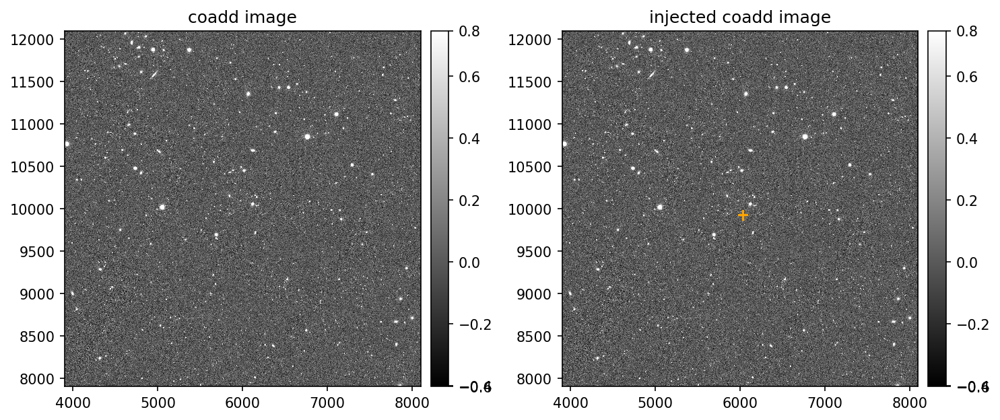

In [100]:
fig, ax = plt.subplots(1, 2, figsize=(10, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', 'zscale')
display0.mtv(coadd.image)

plt.title('coadd image')

plt.sca(ax[1])
display1 = afwDisplay.Display(frame=fig)
display1.scale('linear', 'zscale')

display1.mtv(injected_coadd_1st.image)
for row in my_injection_catalog_LEs:
    coordiante = wcs_b.skyToPixel(geom.SpherePoint(row['ra']*geom.degrees, row['dec']*geom.degrees))
    display1.dot('+', coordiante.x, coordiante.y, size=50, ctype='orange')

plt.title('injected coadd image')

plt.tight_layout()
plt.show()

## plot around the injections

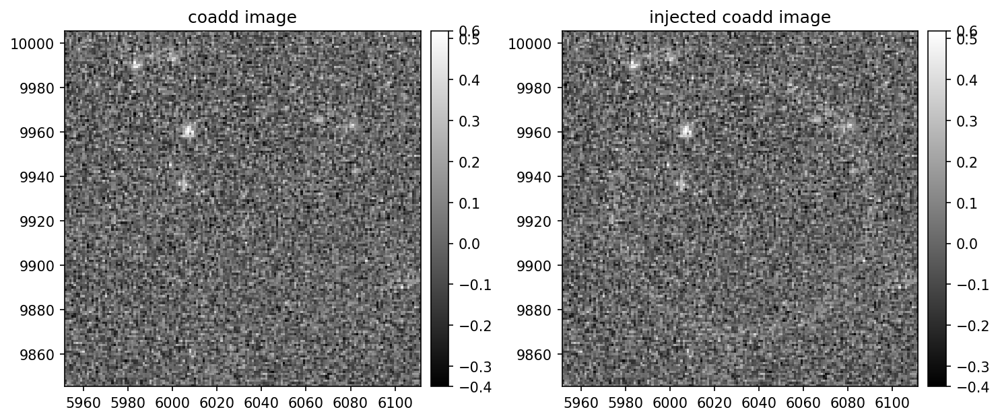

In [101]:
for row in my_injection_catalog_LEs[:10]:
    # center = wcs.skyToPixel(radec)
    if coadd.containsSkyCoords(row['ra']*u.deg, row['dec']*u.deg):
        try:
            fig, ax = plt.subplots(1, 2, figsize=(10, 6), dpi=150)
            plt.sca(ax[0])
            display0 = afwDisplay.Display(frame=fig)
            display0.scale('linear', 'zscale')
           
            coordiante = wcs_b.skyToPixel(geom.SpherePoint(row['ra']*geom.degrees, row['dec']*geom.degrees))
            # display0.dot('+', coordiante.x, coordiante.y, size=50, ctype='orange')
            display0.mtv(coadd.image[coordiante.x-80:coordiante.x+80, coordiante.y-80:coordiante.y+80])
            
            plt.title('coadd image')
    
            plt.sca(ax[1])
            display1 = afwDisplay.Display(frame=fig)
            display1.scale('linear', 'zscale')
            display1.mtv(injected_coadd_1st.image[coordiante.x-80:coordiante.x+80, coordiante.y-80:coordiante.y+80])
            plt.title('injected coadd image')
    
            plt.tight_layout()
            plt.show()
        except:
            print("Too large")
     

In [139]:
numpy_cutouts = {}
scales = []
for i in range(len(list_fits)):
    ids_to_use_time_fits = i #ids_to_use_time
    which_fits = list_fits[ids_to_use_time_fits]
    fits_img = fits.open(which_fits)[0].data
    mags_plot = -2.5*np.log10(fits_img)-48.6
    mags_plot = np.nan_to_num(mags_plot, nan=0.0, posinf=0.0, neginf=0.0)
    ns = imsize/((mags_plot.shape[0])*wcs_b.getPixelScale().asDegrees())
    Ns = int((ns*ns) - 10)
    if Ns > 20:
        Ns = 1
    print("mean surface", np.mean(mags_plot[fits_img>0]))
    my_injection_catalog_LEs = generate_injection_catalog(
        ra_lim=[radec.ra.value-inject_size, radec.ra.value+inject_size],
        dec_lim=[radec.dec.value-inject_size, radec.dec.value+inject_size],
        number=Ns,
        seed='3210',
        source_type= "Stamp",
        mag=[np.mean(mags_plot[fits_img>0])-1],
        stamp= [which_fits],
    )


    inject_config = VisitInjectConfig()
    inject_task = VisitInjectTask(config=inject_config)


    psf = coadd.getPsf()
    photo_calib = coadd.getPhotoCalib()
    # wcs = coadd.getWcs()
    
    injected_output = inject_task.run(
        # injection_catalogs=[my_injection_catalog_LEs, my_injection_catalog_source],
        injection_catalogs=[my_injection_catalog_LEs],
        
        input_exposure=coadd.clone(),
        psf=psf,
        photo_calib=photo_calib,
        wcs=wcs_b,
    )
    injected_coadd_1st = injected_output.output_exposure
    injected_catalog = injected_output.output_catalog

    for row in my_injection_catalog_LEs:
        center = wcs_b.skyToPixel(geom.SpherePoint(row['ra']*geom.degrees, row['dec']*geom.degrees))
        s = 160
        extent = geom.Extent2I(s, s)
        template_cutout = injected_coadd_1st.getCutout(center, extent)
        numpy_cutouts[f"inj_{i}"] = template_cutout.image.array
        scale = template_cutout.wcs.getPixelScale(template_cutout.getBBox().getCenter()).asArcseconds()
        scales.append(scale)
    

/tmp/ipykernel_327475/3760932971.py:7: RuntimeWarning: divide by zero encountered in log10
  mags_plot = -2.5*np.log10(fits_img)-48.6
/tmp/ipykernel_327475/3760932971.py:7: RuntimeWarning: divide by zero encountered in log10
  mags_plot = -2.5*np.log10(fits_img)-48.6


mean surface 21.82548612813204
mean surface 21.82795300148648


/tmp/ipykernel_327475/3760932971.py:7: RuntimeWarning: divide by zero encountered in log10
  mags_plot = -2.5*np.log10(fits_img)-48.6
/tmp/ipykernel_327475/3760932971.py:7: RuntimeWarning: divide by zero encountered in log10
  mags_plot = -2.5*np.log10(fits_img)-48.6


mean surface 21.834609711393266
mean surface 21.840431083072
mean surface 21.849359327682937


/tmp/ipykernel_327475/3760932971.py:7: RuntimeWarning: divide by zero encountered in log10
  mags_plot = -2.5*np.log10(fits_img)-48.6


In [140]:
import astropy.visualization as aviz
import matplotlib
# matplotlib.use("AGG")
# Force matplotlib defaults
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
import matplotlib.pyplot as plt
from matplotlib import cm
import io

def plot_one_image(ax, data, size, scale, name=None):
    """Plot a normalized image on an axis."""
    if name == "Difference":
        norm = aviz.ImageNormalize(
            # focus on a rect of dim 15 at the center of the image.
            data[data.shape[0] // 2 - 7:data.shape[0] // 2 + 8,
                 data.shape[1] // 2 - 7:data.shape[1] // 2 + 8],
            interval=aviz.MinMaxInterval(),
            stretch=aviz.AsinhStretch(a=0.9),
        )
    else:
        norm = aviz.ImageNormalize(
            data,
            interval=aviz.MinMaxInterval(),
            stretch=aviz.AsinhStretch(a=0.1),
            # stretch=aviz.ZScaleInterval(),
        )
    ax.imshow(data, cmap=cm.bone, interpolation="none", norm=norm,
              extent=(0, size, 0, size), origin="lower", aspect="equal")
    # x_line = 1
    # y_line = 1
    # ax.plot((x_line, x_line + 1.0/scale), (y_line, y_line), color="blue", lw=6)
    # ax.plot((x_line, x_line + 1.0/scale), (y_line, y_line), color="yellow", lw=2)
    ax.axis("off")
    if name is not None:
        ax.set_title(name)



In [141]:
times = [x.split("ct")[1].split('_')[0] for x in list_fits]

In [142]:
times

['400', '450', '500', '550', '700']

In [145]:
fig, axs = plt.subplots(1, 1, constrained_layout=True)
plot_one_image(axs, numpy_cutouts['inj_3'], 160, scales[3], "Difference")
# output = io.BytesIO()
# plt.savefig('interactive.png', bbox_inches="tight", format="png")
# output.seek(0)

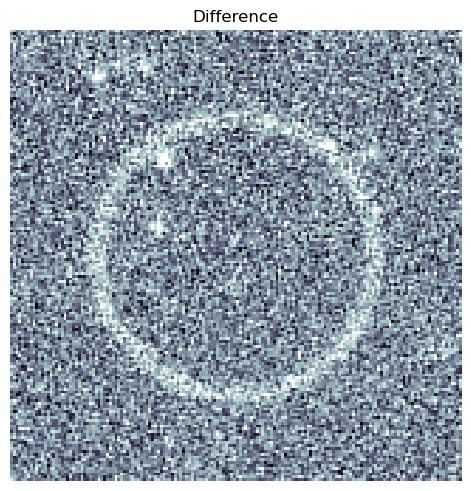

In [146]:

plt.show()


In [147]:
import imageio

In [148]:
frames = []
for ss in range(len(numpy_cutouts)):
    fig, axs = plt.subplots(1, 1, constrained_layout=True)
    plot_one_image(axs, numpy_cutouts[f'inj_{ss}'], 160, scales[ss], "Difference")
    plt.title(f"{times[ss]} days")
    output = io.BytesIO()
    plt.savefig('interactive.png', bbox_inches="tight", format="png")
    output.seek(0)
    # if yx[ss][0] != 245:
    image = imageio.v2.imread(f'interactive.png')
    frames.append(image)

imageio.mimsave('LE2011_gif_nersx.gif', # output gif
                frames, loop = 4,         # array of input frames
                fps = 1) 

# Define injection catalog

## 2nd image

In [63]:
ids_to_use_time = 4
coadd = butler.get(coadd_to_use[ids_to_use_time])
boxcen = coadd.getBBox().getCenter()
wcs_b = coadd.getWcs()
cen = wcs_b.pixelToSky(boxcen)
radec = SkyCoord(ra=cen[0].asDegrees()*u.deg, dec=cen[1].asDegrees()*u.deg)

print(radec)

imsize = coadd.getBBox().getDimensions()[0]*wcs_b.getPixelScale().asDegrees()
print('Size of calexp in degrees: ', imsize)

inject_size = imsize/2


ids_to_use_time_fits = 2 #ids_to_use_time
which_fits = list_fits[ids_to_use_time_fits]
fits_img = fits.open(which_fits)[0].data
mags_plot = -2.5*np.log10(fits_img)-48.6
mags_plot = np.nan_to_num(mags_plot, nan=0.0, posinf=0.0, neginf=0.0)
ns = imsize/((mags_plot.shape[0])*wcs_b.getPixelScale().asDegrees())
Ns = int((ns*ns) - 10)
if Ns > 20:
    Ns = 20
print("mean surface", np.mean(mags_plot[fits_img>0]))
my_injection_catalog_LEs = generate_injection_catalog(
    ra_lim=[radec.ra.value-inject_size, radec.ra.value+inject_size],
    dec_lim=[radec.dec.value-inject_size, radec.dec.value+inject_size],
    number=Ns,
    seed='3210',
    source_type= "Stamp",
    mag=[np.mean(mags_plot[fits_img>0])],
    stamp= [which_fits],
)

# with open(list_metadata[ids_to_use_time], 'rb') as f:
#     meta_data = pickle.load(f)

# resx = coadd.getBBox().getDimensions()[0]*wcs_b.getPixelScale().asDegrees()/coadd.getBBox().getDimensions()[0]
# resy= coadd.getBBox().getDimensions()[1]*wcs_b.getPixelScale().asDegrees()/coadd.getBBox().getDimensions()[1]
# center_shift = [resx*(meta_data[0]['act (arcsec)']/0.2), resy*(meta_data[0]['bct (arcsec)']/0.2)]


# my_injection_catalog_source = generate_injection_catalog(
#     ra_lim=[radec.ra.value-inject_size, radec.ra.value+inject_size],
#     dec_lim=[radec.dec.value-inject_size, radec.dec.value+inject_size],
#     number=Ns,
#     seed='3210',
#     source_type= "Star",
#     mag=[np.mean(mags_plot[fits_img>0])-3],
# )

# my_injection_catalog_source['mag'] = my_injection_catalog_source['mag']+0.5
# my_injection_catalog_source['dec'] = my_injection_catalog_source['dec']+center_shift[1]


<SkyCoord (ICRS): (ra, dec) in deg
    (57.85714959, -35.17965612)>
Size of calexp in degrees:  0.23333333327427816
mean surface 21.38767757742151


/tmp/ipykernel_282546/592419661.py:19: RuntimeWarning: divide by zero encountered in log10
  mags_plot = -2.5*np.log10(fits_img)-48.6


# Inject on image

In [64]:
inject_config = VisitInjectConfig()
inject_task = VisitInjectTask(config=inject_config)

In [65]:
psf = coadd.getPsf()
photo_calib = coadd.getPhotoCalib()
# wcs = coadd.getWcs()

injected_output = inject_task.run(
    injection_catalogs=[my_injection_catalog_LEs,my_injection_catalog_source],
    input_exposure=coadd.clone(),
    psf=psf,
    photo_calib=photo_calib,
    wcs=wcs_b,
)
injected_coadd_2nd = injected_output.output_exposure
injected_catalog = injected_output.output_catalog

## Plot original and injected

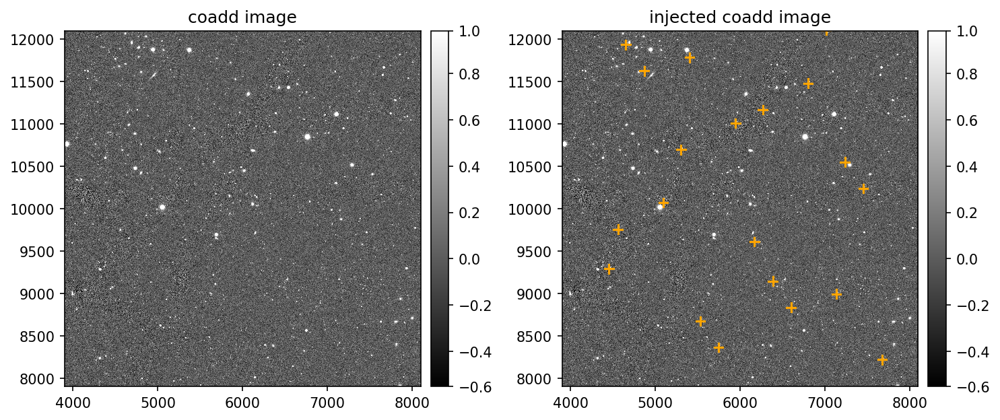

In [66]:
# injected_coadd_2nd = injected_exposure.clone()

fig, ax = plt.subplots(1, 2, figsize=(10, 6), dpi=150)

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', 'zscale')
display0.mtv(coadd.image)

plt.title('coadd image')

plt.sca(ax[1])
display1 = afwDisplay.Display(frame=fig)
display1.scale('linear', 'zscale')

display1.mtv(injected_coadd_2nd.image)
for row in my_injection_catalog_LEs:
    coordiante = wcs_b.skyToPixel(geom.SpherePoint(row['ra']*geom.degrees, row['dec']*geom.degrees))
    display1.dot('+', coordiante.x, coordiante.y, size=50, ctype='orange')

plt.title('injected coadd image')

plt.tight_layout()
plt.show()

## plot around the injections

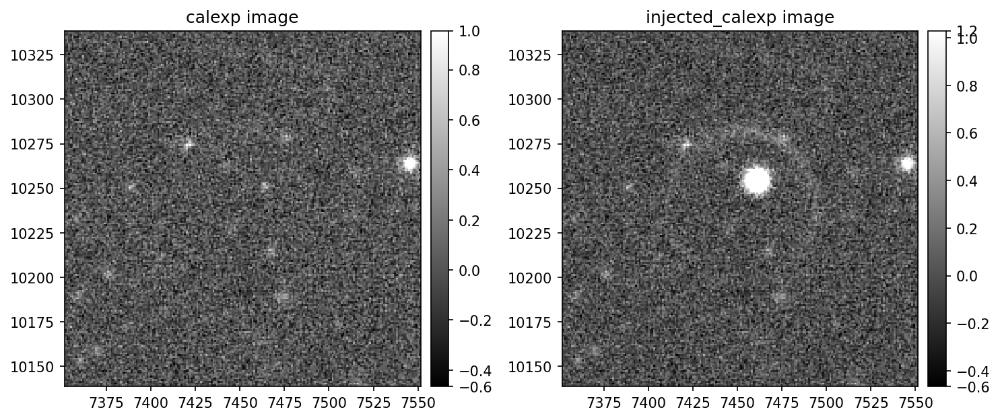

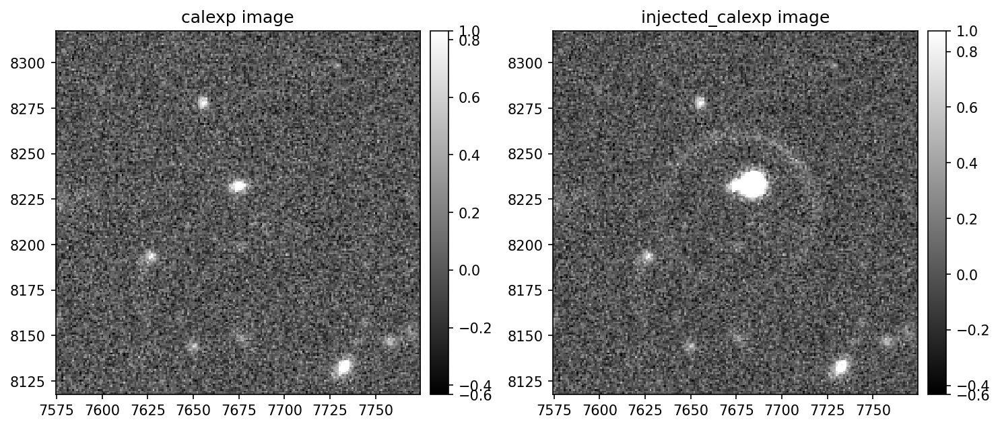

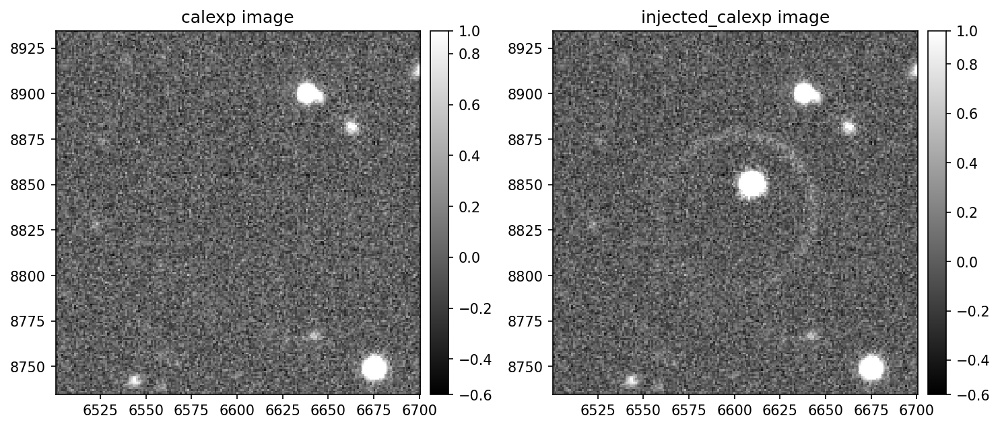

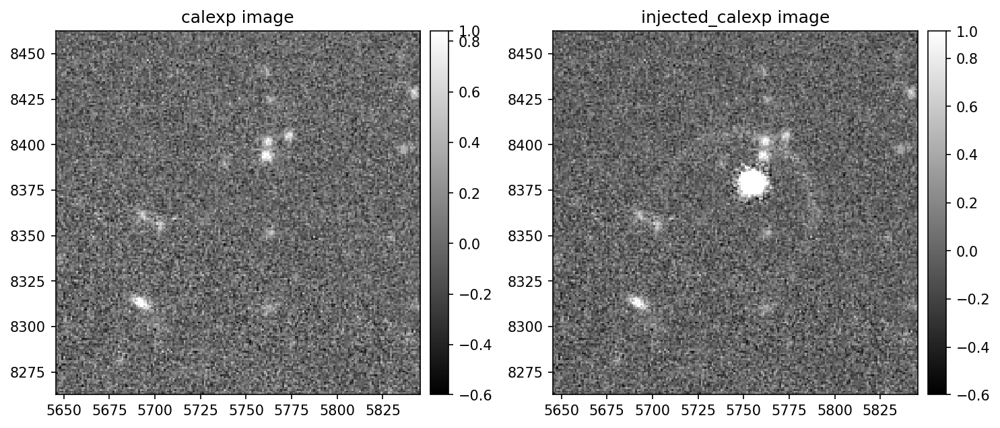

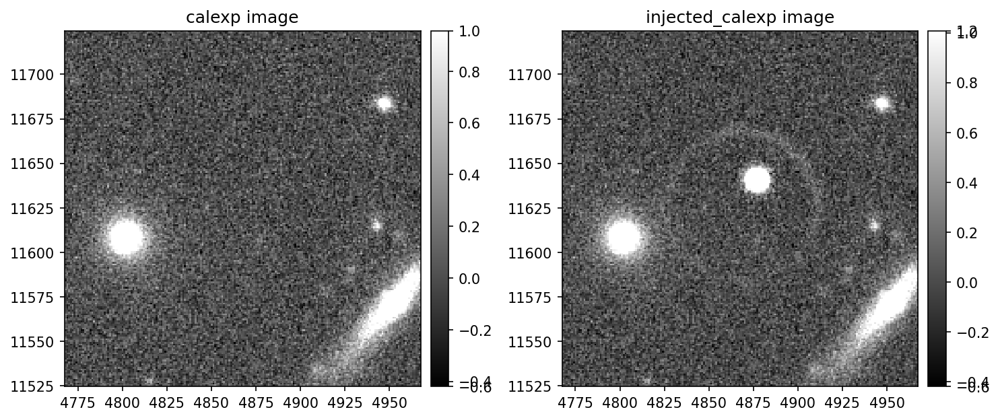

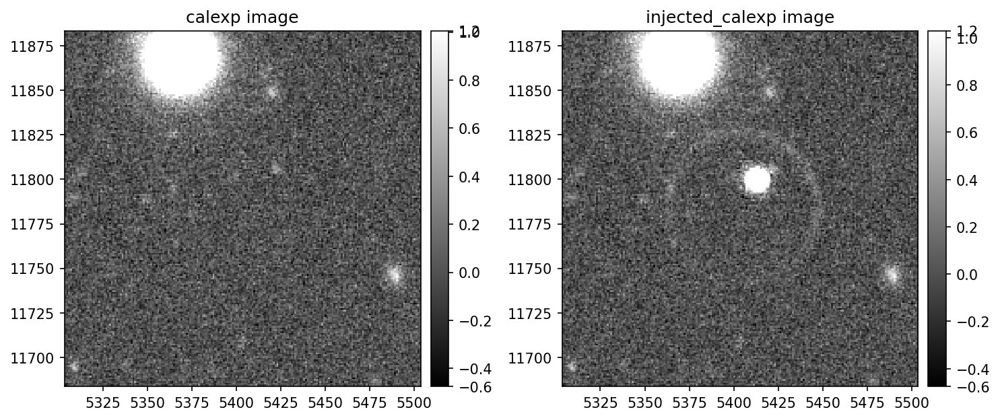

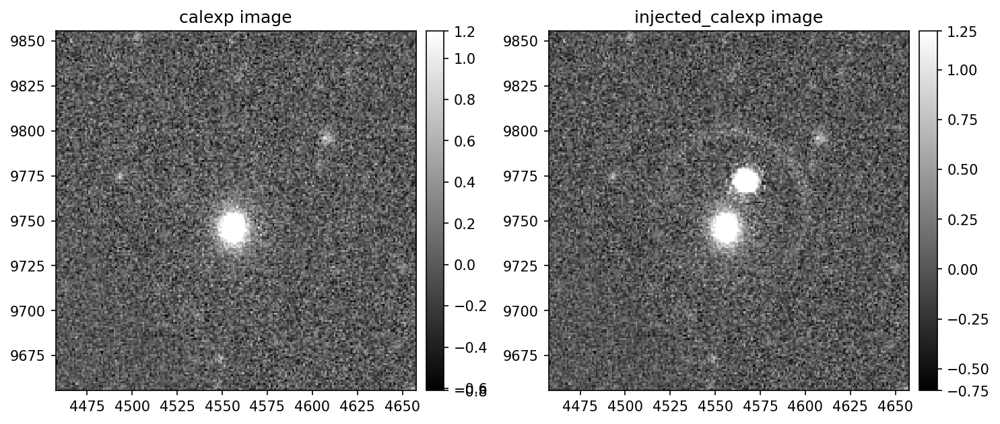

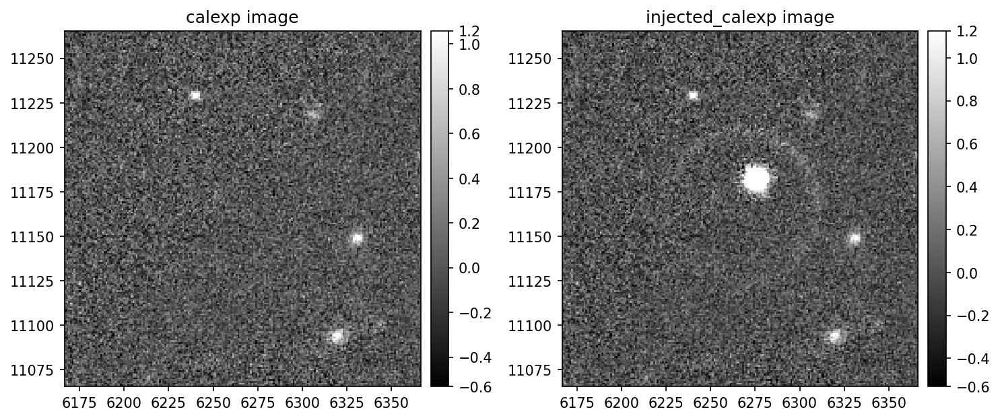

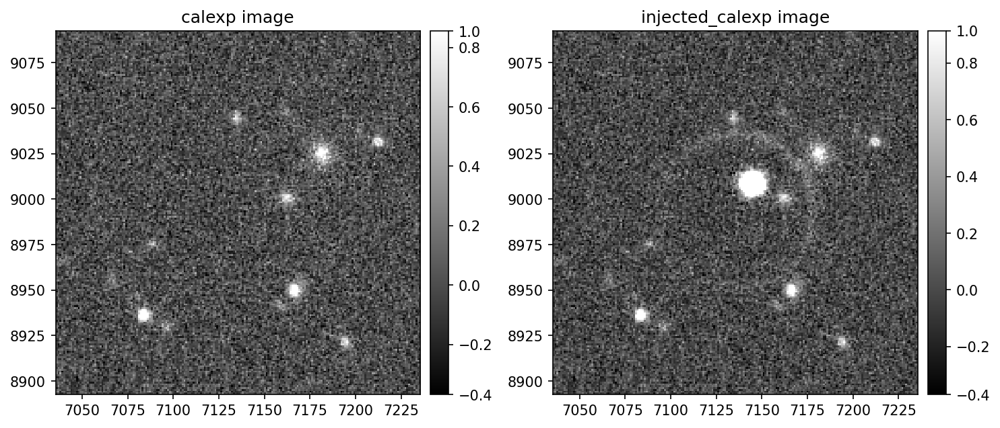

In [67]:
for row in my_injection_catalog_LEs[:10]:
    # center = wcs.skyToPixel(radec)
    if coadd.containsSkyCoords(row['ra']*u.deg, row['dec']*u.deg):
        try:
            fig, ax = plt.subplots(1, 2, figsize=(10, 6), dpi=150)
            plt.sca(ax[0])
            display0 = afwDisplay.Display(frame=fig)
            display0.scale('linear', 'zscale')
           
            coordiante = wcs_b.skyToPixel(geom.SpherePoint(row['ra']*geom.degrees, row['dec']*geom.degrees))
            # display0.dot('+', coordiante.x, coordiante.y, size=50, ctype='orange')
            display0.mtv(coadd.image[coordiante.x-100:coordiante.x+100, coordiante.y-100:coordiante.y+100])
            
            plt.title('calexp image')
    
            plt.sca(ax[1])
            display1 = afwDisplay.Display(frame=fig)
            display1.scale('linear', 'zscale')
            display1.mtv(injected_coadd_2nd.image[coordiante.x-100:coordiante.x+100, coordiante.y-100:coordiante.y+100])
            plt.title('injected_calexp image')
    
            plt.tight_layout()
            plt.show()
        except:
            print("Too large")

In [68]:
from lsst.meas.algorithms.detection import SourceDetectionTask, SourceDetectionConfig
from lsst.pipe.tasks.characterizeImage import CharacterizeImageTask, CharacterizeImageConfig
import lsst.afw.table as afwTable

from lsst.meas.deblender import SourceDeblendTask, SourceDeblendConfig
from lsst.meas.base import SingleFrameMeasurementTask, SingleFrameMeasurementConfig
from lsst.meas.base import ForcedMeasurementTask

In [69]:
schema = afwTable.SourceTable.makeMinimalSchema()
print(schema)
raerr = schema.addField("coord_raErr", type="F")
decerr = schema.addField("coord_decErr", type="F")

Schema(
    (Field['L'](name="id", doc="unique ID"), Key<L>(offset=0, nElements=1)),
    (Field['Angle'](name="coord_ra", doc="position in ra/dec"), Key<Angle>(offset=8, nElements=1)),
    (Field['Angle'](name="coord_dec", doc="position in ra/dec"), Key<Angle>(offset=16, nElements=1)),
    (Field['L'](name="parent", doc="unique ID of parent source"), Key<L>(offset=24, nElements=1)),
)



In [70]:
config = CharacterizeImageConfig()
config.psfIterations = 3
charImageTask = CharacterizeImageTask(config=config)
del config


config = SourceDetectionConfig()
config.thresholdValue = 10
sourceDetectionTask = SourceDetectionTask(schema=schema, config=config)

config = SourceDeblendConfig()
sourceDeblendTask = SourceDeblendTask(schema=schema, config=config)

config = SingleFrameMeasurementConfig()
sourceMeasurementTask = SingleFrameMeasurementTask(schema=schema,
                                                   config=config)

In [71]:
tab = afwTable.SourceTable.make(schema)

In [72]:
result = charImageTask.run(injected_coadd_2nd)

Setting gain to 1
Setting gain to 1
Setting gain to 1


In [73]:
result = sourceDetectionTask.run(tab, injected_coadd_2nd)

In [74]:
sources = result.sources

In [75]:
sources.getSchema()

Schema(
    (Field['L'](name="id", doc="unique ID"), Key<L>(offset=0, nElements=1)),
    (Field['Angle'](name="coord_ra", doc="position in ra/dec"), Key<Angle>(offset=8, nElements=1)),
    (Field['Angle'](name="coord_dec", doc="position in ra/dec"), Key<Angle>(offset=16, nElements=1)),
    (Field['L'](name="parent", doc="unique ID of parent source"), Key<L>(offset=24, nElements=1)),
    (Field['F'](name="coord_raErr"), Key<F>(offset=32, nElements=1)),
    (Field['F'](name="coord_decErr"), Key<F>(offset=36, nElements=1)),
    (Field['I'](name="deblend_nChild", doc="Number of children this object has (defaults to 0)"), Key<I>(offset=40, nElements=1)),
    (Field['Flag'](name="deblend_deblendedAsPsf", doc="Deblender thought this source looked like a PSF"), Key['Flag'](offset=48, bit=0)),
    (Field['D'](name="deblend_psfCenter_x", doc="If deblended-as-psf, the PSF centroid", units="pixel"), Key<D>(offset=56, nElements=1)),
    (Field['D'](name="deblend_psfCenter_y", doc="If deblended-as-p

In [76]:
sourceDeblendTask.run(injected_coadd_2nd, sources)

In [77]:
sourceMeasurementTask.run(measCat=sources, exposure=injected_coadd_2nd)

In [78]:
sources = sources.copy(True)

# Load the source catalog for the 2nd image (the most recent)

In [79]:
# for cc in collection_to_use:
butler = Butler(repo, collections=collection_to_use[ids_to_use_time])
src_refs = butler.registry.queryDatasets("deepCoadd_meas", where="tract = 4026 AND patch = 15 AND skymap = 'DC2' AND band = 'y' ")
src_catalog = [butler.get(src_ref) for src_ref in src_refs]

In [80]:
len(src_catalog)

1

In [81]:
# src_catalog[0]

In [82]:
sources

<class 'lsst.afw.table.SourceCatalog'>
 id       coord_ra      ... base_Variance_flag_emptyFootprint
            rad         ...                                  
---- ------------------ ... ---------------------------------
   1 1.0104026645307882 ...                             False
   2 1.0097584171882779 ...                             False
   3 1.0076118413144803 ...                             False
   4 1.0118210003439105 ...                             False
   5 1.0108105643072436 ...                             False
   6 1.0106774901246978 ...                             False
   7  1.012072327946255 ...                             False
   8 1.0079206435819432 ...                             False
   9  1.009511726712167 ...                             False
 ...                ... ...                               ...
3100 1.0091390877469706 ...                             False
3101 1.0091417940068996 ...                             False
3102 1.0111370409639509 ...    

# Image subtraction

In [83]:
config = AlardLuptonSubtractConfig()

alTask = AlardLuptonSubtractTask(config=config)

# result = alTask.run(injected_coadd_1st, injected_coadd_2nd, src_catalog[0])
result = alTask.run(injected_coadd_1st, injected_coadd_2nd, sources)


Could not apply source flag: "Field with name 'sky_source' not found"


## Plot 2nd - 1st = diff

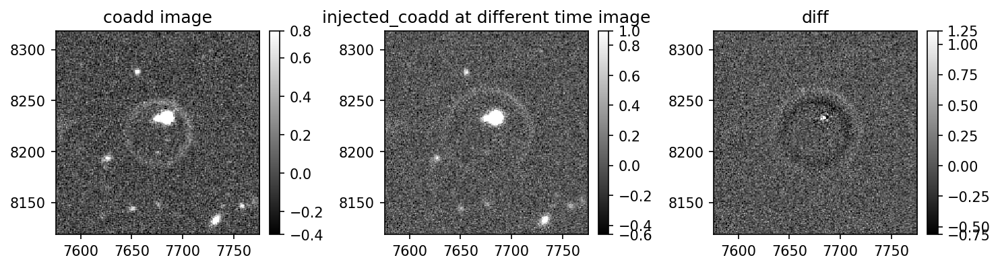

In [84]:
fig, ax = plt.subplots(1, 3, figsize=(10, 6), dpi=150)
coordiante = wcs_b.skyToPixel(geom.SpherePoint(my_injection_catalog_LEs[1]['ra']*geom.degrees, my_injection_catalog_LEs[1]['dec']*geom.degrees))

plt.sca(ax[0])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', 'zscale')
# display0.scale('linear', min=-0.2, max=0.1)
display0.mtv(injected_coadd_1st.image[coordiante.x+100:coordiante.x-100, coordiante.y+100:coordiante.y-100])
plt.title('coadd image')

plt.sca(ax[1])
display1 = afwDisplay.Display(frame=fig)
display1.scale('linear', 'zscale')

# display0.dot('+', coordiante.x, coordiante.y, size=50, ctype='orange')
display1.mtv(injected_coadd_2nd.image[coordiante.x+100:coordiante.x-100, coordiante.y+100:coordiante.y-100])
plt.title('injected_coadd at different time image')

plt.sca(ax[2])
display2 = afwDisplay.Display(frame=fig)
display2.scale('linear', 'zscale')
# display1.scale('linear', min=-20, max=150)
# display2.mtv(result.difference.image)
# To zoom on the PGC 038749 stamp:
display2.mtv(result.difference.image[coordiante.x+100:coordiante.x-100, coordiante.y+100:coordiante.y-100])
plt.title('diff')

plt.tight_layout()
plt.show()

In [151]:
# from lsst.ip.diffim import DetectAndMeasureConfig, DetectAndMeasureTask

In [152]:
# def detect(coadd_2nd, diff):
#     # Run detection on subtraction
#     config = DetectAndMeasureConfig()
#     detect_and_measure_task = DetectAndMeasureTask(config=config)

#     detect_and_measure = detect_and_measure_task.run(coadd_2nd,
#                                                      diff.matchedTemplate,
#                                                      diff.difference)

#     return detect_and_measure

In [153]:
# detection_catalog = detect(injected_coadd_2nd, result)
# dia_src = detection_catalog.diaSources.asAstropy()

In [154]:
# dia_src

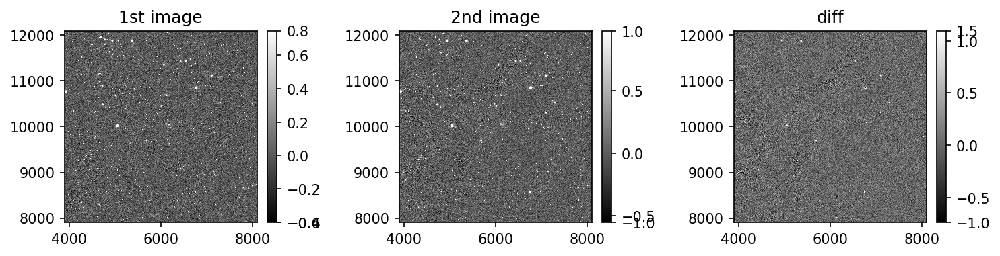

In [85]:
fig, ax = plt.subplots(1, 3, figsize=(10, 6), dpi=150)
plt.sca(ax[0])
display01 = afwDisplay.Display(frame=fig)
display01.scale('linear', 'zscale')
display01.mtv(injected_coadd_1st.image)

plt.title('1st image')
plt.sca(ax[1])
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', 'zscale')
display0.mtv(result.matchedScience.image)

plt.title('2nd image')

plt.sca(ax[2])
display1 = afwDisplay.Display(frame=fig)
display1.scale('linear', 'zscale')
# display1.mtv(injected_coadd_2nd.image)

display1.mtv(result.difference.image)
plt.title('diff')

plt.tight_layout()
plt.show()

In [60]:
# wcs_b = result.difference.getWcs()

In [61]:
# wcs_b = result.difference.getWcs()
# for row in dia_src:
#     # center = wcs.skyToPixel(radec)
#     # if result.difference.containsSkyCoords(row['coord_ra']*u.deg, row['coord_dec']*u.deg):
#     try:
#         fig, ax = plt.subplots(1, 3, figsize=(10, 6), dpi=150)
        
#         coordiante = wcs_b.skyToPixel(geom.SpherePoint(row['coord_ra']*geom.radians, row['coord_dec']*geom.radians))

#         plt.sca(ax[0])
#         display01 = afwDisplay.Display(frame=fig)
#         display01.scale('linear', 'zscale')
#         display01.mtv(injected_coadd_1st.image[coordiante.x-100:coordiante.x+100, coordiante.y-100:coordiante.y+100])

#         plt.title('1st image')
#         plt.sca(ax[1])
#         display0 = afwDisplay.Display(frame=fig)
#         display0.scale('linear', 'zscale')
#         display0.mtv(result.matchedScience.image[coordiante.x-100:coordiante.x+100, coordiante.y-100:coordiante.y+100])
        
#         plt.title('2nd image')

#         plt.sca(ax[2])
#         display1 = afwDisplay.Display(frame=fig)
#         display1.scale('linear', 'zscale')
#         # display1.mtv(injected_coadd_2nd.image[coordiante.x-100:coordiante.x+100, coordiante.y-100:coordiante.y+100])

#         display1.mtv(result.difference.image[coordiante.x-100:coordiante.x+100, coordiante.y-100:coordiante.y+100])
#         plt.title('diff')

#         plt.tight_layout()
#         plt.show()
#     except:
#         print("Too large")
    # else:
    #     print("ewe")

## Plot around the injection

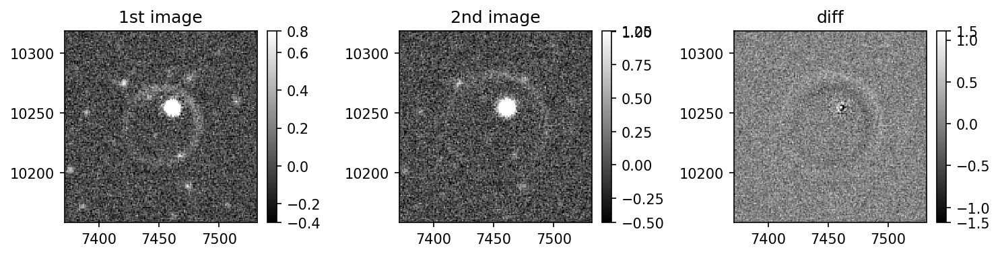

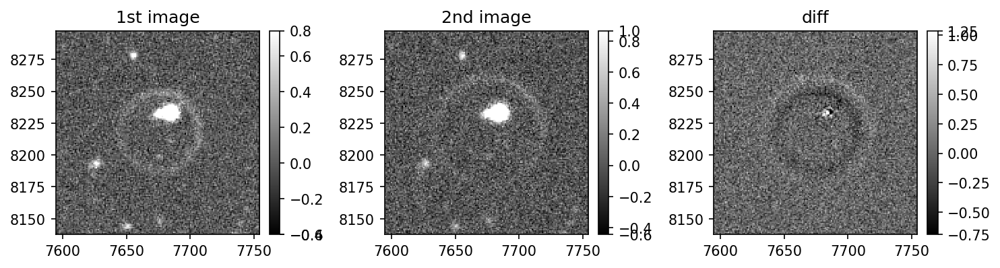

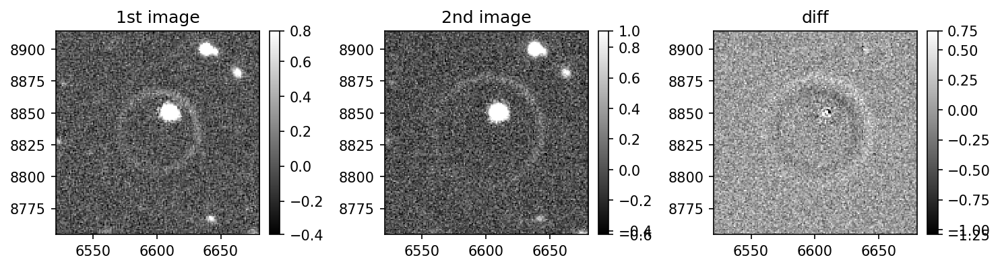

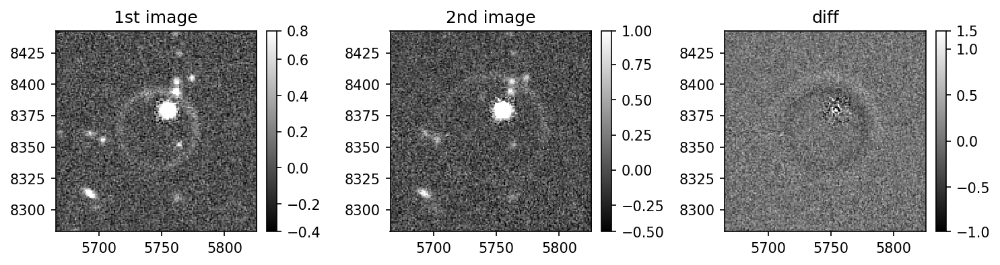

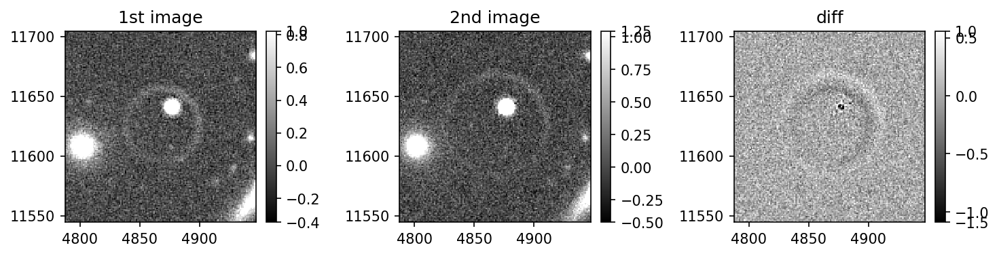

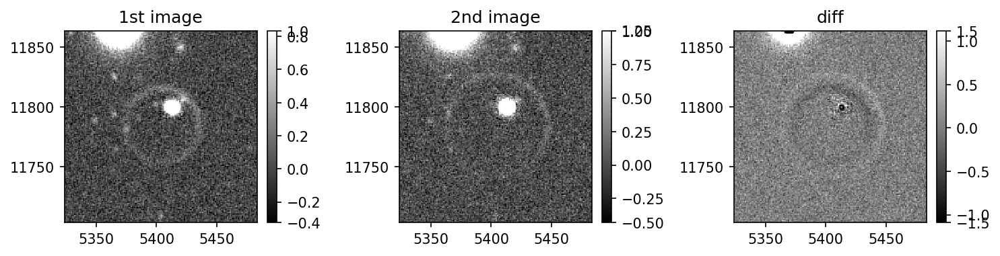

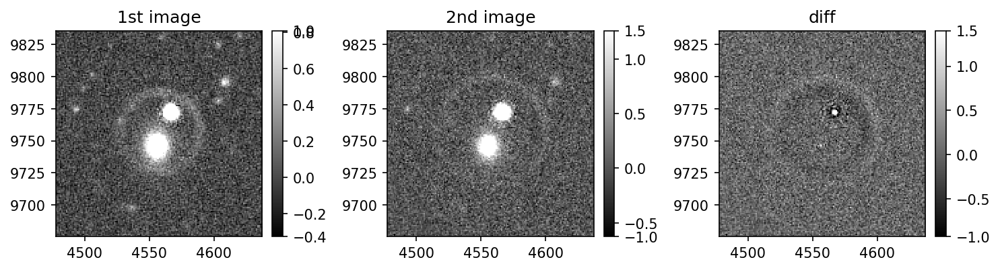

Too large


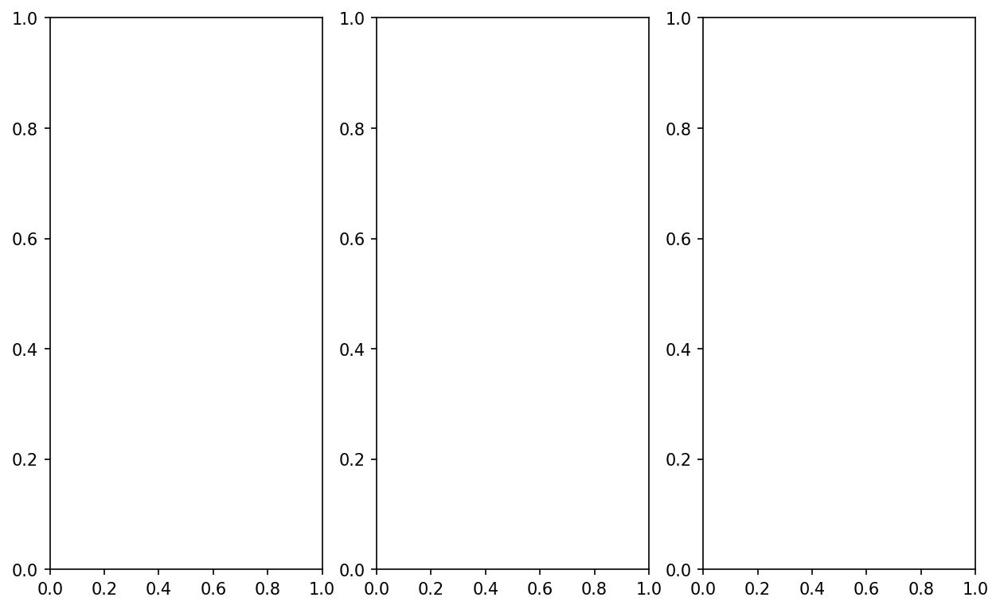

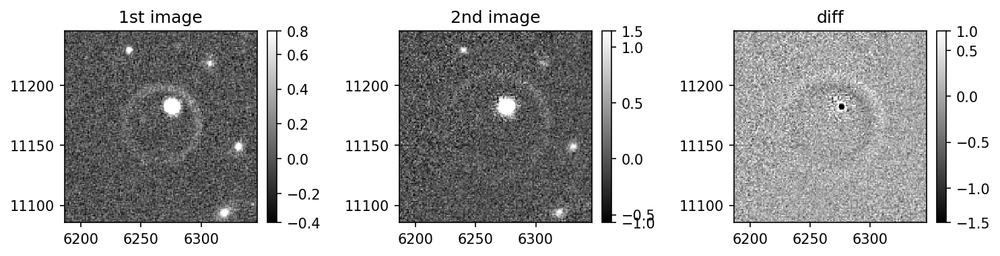

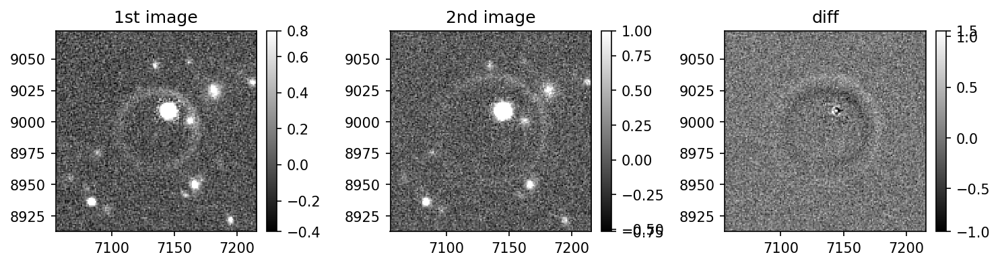

In [86]:
wcs_b = result.difference.getWcs()
for row in my_injection_catalog_LEs[:10]:
    # center = wcs.skyToPixel(radec)
    # if result.difference.containsSkyCoords(row['coord_ra']*u.deg, row['coord_dec']*u.deg):
    try:
        fig, ax = plt.subplots(1, 3, figsize=(10, 6), dpi=150)
        
        coordiante = wcs_b.skyToPixel(geom.SpherePoint(row['ra']*geom.degrees, row['dec']*geom.degrees))

        plt.sca(ax[0])
        display01 = afwDisplay.Display(frame=fig)
        display01.scale('linear', 'zscale')
        display01.mtv(injected_coadd_1st.image[coordiante.x-80:coordiante.x+80, coordiante.y-80:coordiante.y+80])

        plt.title('1st image')
        plt.sca(ax[1])
        display0 = afwDisplay.Display(frame=fig)
        display0.scale('linear', 'zscale')
        display0.mtv(result.matchedScience.image[coordiante.x-80:coordiante.x+80, coordiante.y-80:coordiante.y+80])
        
        plt.title('2nd image')

        plt.sca(ax[2])
        display1 = afwDisplay.Display(frame=fig)
        display1.scale('linear', 'zscale')
        # display1.mtv(injected_coadd_2nd.image[coordiante.x-80:coordiante.x+80, coordiante.y-80:coordiante.y+80])

        display1.mtv(result.difference.image[coordiante.x-80:coordiante.x+80, coordiante.y-80:coordiante.y+80])
        plt.title('diff')

        plt.tight_layout()
        plt.show()
    except:
        print("Too large")



In [78]:
center = wcs_b.skyToPixel(geom.SpherePoint(my_injection_catalog_LEs[0]['ra']*geom.degrees, my_injection_catalog_LEs[0]['dec']*geom.degrees))
s = 200
extent = geom.Extent2I(s, s)

In [79]:
center

Point2D(4622.2616270690141, 8149.7415418331775)

In [80]:
# from lsst.analysis.ap import plotImageSubtractionCutouts

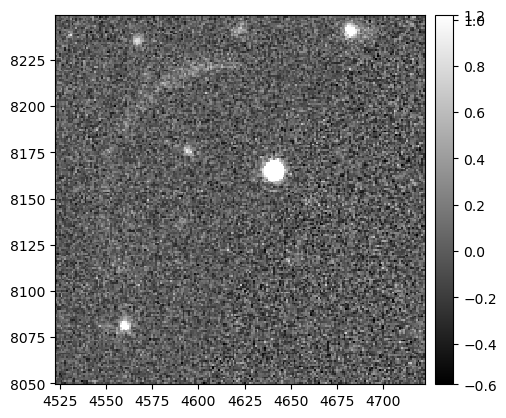

In [81]:
fig, ax = plt.subplots()
display0 = afwDisplay.Display(frame=fig)
display0.scale('linear', 'zscale')
display0.mtv(result.matchedScience.getCutout(center, extent).image)

In [163]:
my_injection_catalog_LEs[0]['stamp'].split('ct')[1].split('_')[0]

'800'

In [118]:
path_name_ids = f"{coadd_to_use[ids_to_use_time].dataId['tract']}_{coadd_to_use[ids_to_use_time].dataId['patch']}_{coadd_to_use[ids_to_use_time].dataId['band']}"

In [121]:
path_name = 'loc'+my_injection_catalog_LEs[0]['stamp'].split('loc')[1].replace('.fits', '')

In [122]:
path_name

'loc[2, 1.3, 1, -32.6156]_dz0.06_w567_angle[100, 220]_sourced52000.0pc'

In [125]:
os.mkdir(f"numpy/{path_name_ids}")
os.mkdir(f"numpy/{path_name_ids}/{path_name}")
numpy_cutouts = {}
for row in my_injection_catalog_LEs[:10]:
    center = wcs_b.skyToPixel(geom.SpherePoint(row['ra']*geom.degrees, row['dec']*geom.degrees))
    s = 200
    extent = geom.Extent2I(s, s)
    science_cutout = result.matchedScience.getCutout(center, extent)
    template_cutout = injected_coadd_1st.getCutout(center, extent)
    difference_cutout = result.difference.getCutout(center, extent)
    dia_source_id = row['injection_id']
    # self.numpy_path.mkdir(dia_source_id)
    numpy_cutouts[f"sci_{s}"] = science_cutout.image.array
    numpy_cutouts[f"temp_{s}"] = template_cutout.image.array
    numpy_cutouts[f"diff_{s}"] = difference_cutout.image.array
    for cutout_type, cutout in numpy_cutouts.items():
        outfile = f'numpy/{path_name_ids}/{path_name}/{dia_source_id}_{cutout_type}.npy'
        np.save(outfile, np.expand_dims(cutout, axis=0))

In [2]:
diff = np.load("numpy/4026_15_r/ring/loc[0.9, 1.3, 1, -163.078]_dz0.06_w567_angle[0, 360]_sourced52000.0pc/1_diff_200_365-600.npy")
tmpl = np.load("numpy/4026_15_r/ring/loc[0.9, 1.3, 1, -163.078]_dz0.06_w567_angle[0, 360]_sourced52000.0pc/1_temp_200_365-600.npy")
sci = np.load("numpy/4026_15_r/ring/loc[0.9, 1.3, 1, -163.078]_dz0.06_w567_angle[0, 360]_sourced52000.0pc/1_sci_200_365-600.npy")


In [3]:
diff[0]

array([[-0.14541657,  0.03408324, -0.07591961, ...,  0.05305828,
         0.00084822,  0.06722154],
       [ 0.04625398, -0.21907324, -0.08861943, ...,  0.02604333,
         0.20598836,  0.11167359],
       [ 0.31444892, -0.21131992, -0.25727037, ..., -0.05327614,
        -0.05899976,  0.2178938 ],
       ...,
       [-0.04900071, -0.04429905, -0.13548152, ...,  0.10563725,
         0.03392673,  0.08141274],
       [ 0.01476194,  0.27392218,  0.14331536, ..., -0.04552904,
         0.22673123,  0.31190276],
       [-0.13020383, -0.03841792, -0.10914402, ...,  0.26537728,
         0.07543492,  0.03347752]], dtype=float32)

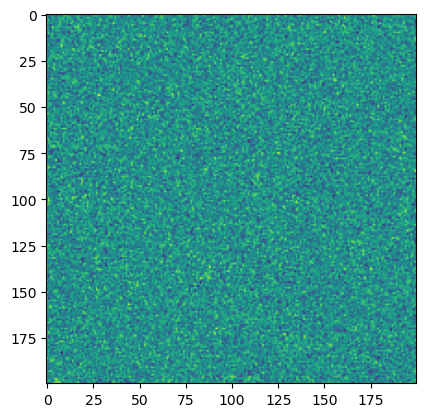

In [4]:
plt.imshow(diff[0])
plt.show()

In [150]:
import astropy.visualization as aviz
import matplotlib
matplotlib.use("AGG")
# Force matplotlib defaults
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
import matplotlib.pyplot as plt
from matplotlib import cm

def plot_one_image(ax, data, size, scale, name=None):
    """Plot a normalized image on an axis."""
    if name == "Difference":
        norm = aviz.ImageNormalize(
            # focus on a rect of dim 15 at the center of the image.
            data[data.shape[0] // 2 - 7:data.shape[0] // 2 + 8,
                 data.shape[1] // 2 - 7:data.shape[1] // 2 + 8],
            interval=aviz.MinMaxInterval(),
            stretch=aviz.AsinhStretch(a=0.1),
        )
    else:
        norm = aviz.ImageNormalize(
            data,
            interval=aviz.MinMaxInterval(),
            stretch=aviz.AsinhStretch(a=0.1),
        )
    ax.imshow(data, cmap=cm.bone, interpolation="none", norm=norm,
              extent=(0, size, 0, size), origin="lower", aspect="equal")
    x_line = 1
    y_line = 1
    ax.plot((x_line, x_line + 1.0/scale), (y_line, y_line), color="blue", lw=6)
    ax.plot((x_line, x_line + 1.0/scale), (y_line, y_line), color="yellow", lw=2)
    ax.axis("off")
    if name is not None:
        ax.set_title(name)

# except:
#     pass

In [151]:
import io

In [159]:
# os.mkdir(f"numpy/{path_name_ids}")
# os.mkdir(f"numpy/{path_name_ids}/{path_name}")
numpy_cutouts = {}
for row in my_injection_catalog_LEs[:1]:
    center = wcs_b.skyToPixel(geom.SpherePoint(row['ra']*geom.degrees, row['dec']*geom.degrees))
    s = 200
    extent = geom.Extent2I(s, s)
    science_cutout = result.matchedScience.getCutout(center, extent)
    template_cutout = injected_coadd_1st.getCutout(center, extent)
    difference_cutout = result.difference.getCutout(center, extent)
    dia_source_id = row['injection_id']
    # self.numpy_path.mkdir(dia_source_id)
    numpy_cutouts[f"sci_{s}"] = science_cutout.image.array
    numpy_cutouts[f"temp_{s}"] = template_cutout.image.array
    numpy_cutouts[f"diff_{s}"] = difference_cutout.image.array

        # try:
    scale = science_cutout.wcs.getPixelScale(science_cutout.getBBox().getCenter()).asArcseconds()
    fig, axs = plt.subplots(1, 3, constrained_layout=True)
    plot_one_image(axs[0], template_cutout.image.array, 200, scale, "1st inj")
    plot_one_image(axs[1], science_cutout.image.array, 200, scale, "2nd inj")
    plot_one_image(axs[2], difference_cutout.image.array, 200, scale, "Difference")
    
    output = io.BytesIO()
    # plt.show()
    plt.savefig("test.png", bbox_inches="tight", format="png")
    output.seek(0)

    for cutout_type, cutout in numpy_cutouts.items():
        outfile = f'numpy/{path_name_ids}/{path_name}/{dia_source_id}_{cutout_type}.npy'
        np.save(outfile, np.expand_dims(cutout, axis=0))

In [158]:
output

In [167]:
list_fits[0].split('surface')[0]

'fits/4026_15/'